## Label Transfer

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as an
import os

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

/home/cqy/anaconda3/envs/scarches/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


scanpy==1.10.1 anndata==0.10.7 umap==0.5.6 numpy==1.26.4 scipy==1.13.0 pandas==1.5.3 scikit-learn==1.4.2 statsmodels==0.14.2 igraph==0.11.4 pynndescent==0.5.12


### 1. Post-treatment stroma datasets

#### 1.1 Patient filtering

In [33]:
fibroblast = sc.read_h5ad("../data/fibroblast.h5ad")
fibroblast = fibroblast.raw.to_adata()
fibroblast.uns['log1p']["base"] = None
fibroblast

AnnData object with n_obs × n_vars = 142783 × 31901
    obs: 'sampleID', 'cellID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'total_counts_rb', 'pct_counts_rb', 'leiden_0.6', 'major_cell_type', 'Gender', 'Age', 'Histology', 'PD1', 'Chemotherapy', 'Targeted Therapy', 'Cycles', 'Pathological Response', 'Pathological Response Rate', 'Radiological Response', 'Radiological Shrinkage', 'Major Response'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'rb', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_0.6_colors', 'leiden_colors', 'log1p', 'major_cell_type_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    obsp: 'connectivities', 'distances'

In [34]:
metadata = pd.read_csv("5.LabelTransfer/metadata.csv")
metadata.head(5)

,sampleID,Gender,Age,Histology,PD1,Chemotherapy,Targeted Therapy,Cycles,Pathological Response,Radiological Response,Major Response,Major Radio Response
0,P18,F,52,LUAD,Pembrolizumab,Carboplatin + Pemetrexed,No,2,pCR,PR,MPR,PR
1,P22,M,68,LUSC,Sintilimab,Carboplatin + Abraxane,No,2,non-MPR,PR,non-MPR,PR
2,P43,M,46,LUAD,Camrelizumab,Cisplatin(C1) + Carboplatin(C2) + Pemetrexed(C...,Bevacizumab,2,non-MPR,PR,non-MPR,PR
3,P52,F,34,LUAD,Sintilimab(C1),Carboplatin + Pemetrexed,No,3,non-MPR,PR,non-MPR,PR
4,P64,M,64,LUAD,Pembrolizumab,Carboplatin + Pemetrexed,No,3,non-MPR,PR,non-MPR,PR


In [35]:
fibroblast = fibroblast[fibroblast.obs["sampleID"].isin(metadata["sampleID"])]
fibroblast

View of AnnData object with n_obs × n_vars = 87989 × 31901
    obs: 'sampleID', 'cellID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'total_counts_rb', 'pct_counts_rb', 'leiden_0.6', 'major_cell_type', 'Gender', 'Age', 'Histology', 'PD1', 'Chemotherapy', 'Targeted Therapy', 'Cycles', 'Pathological Response', 'Pathological Response Rate', 'Radiological Response', 'Radiological Shrinkage', 'Major Response'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'rb', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_0.6_colors', 'leiden_colors', 'log1p', 'major_cell_type_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    obsp: 'connectivities', 'distances'

#### 1.2 Clustering

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:03)


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


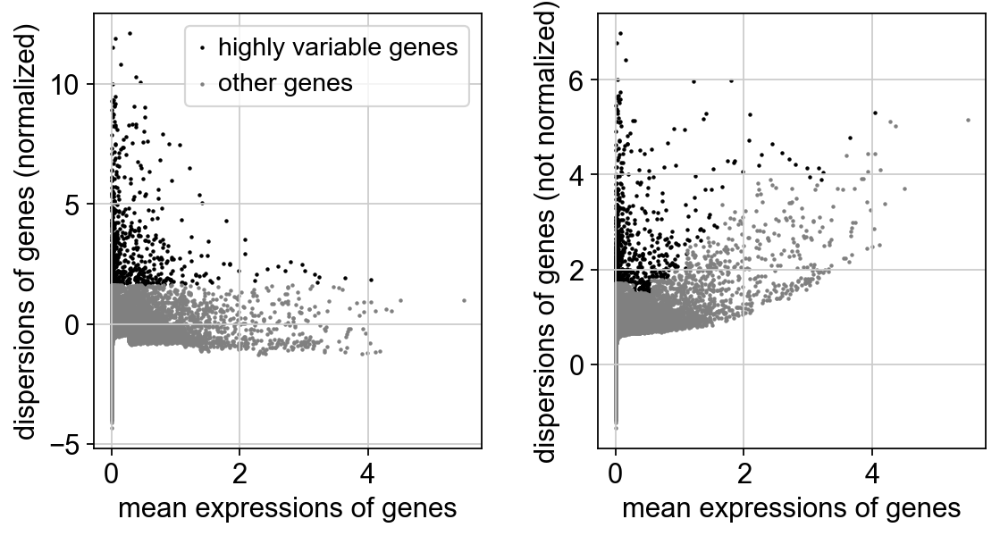

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)


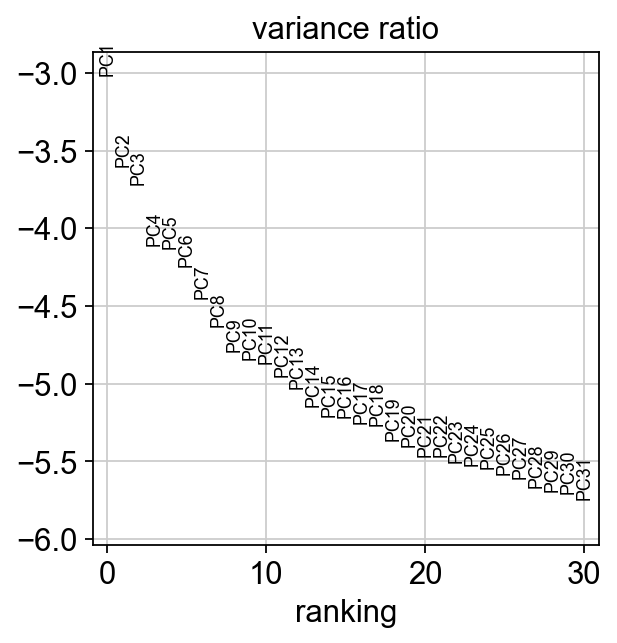

In [36]:
# HVG
sc.pp.highly_variable_genes(fibroblast, n_top_genes = 1000)
sc.pl.highly_variable_genes(fibroblast)
fibroblast.raw = fibroblast
fibroblast = fibroblast[:, fibroblast.var.highly_variable]
fibroblast

sc.pp.scale(fibroblast, max_value=10)
sc.tl.pca(fibroblast, svd_solver='arpack')
sc.pl.pca_variance_ratio(fibroblast, log=True)

In [37]:
# harmony
sc.external.pp.harmony_integrate(fibroblast, "sampleID")
fibroblast.obsm['X_pca'] = fibroblast.obsm['X_pca_harmony']

2024-04-27 17:22:50,857 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-04-27 17:23:09,538 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-04-27 17:23:10,021 - harmonypy - INFO - Iteration 1 of 10
2024-04-27 17:24:06,705 - harmonypy - INFO - Iteration 2 of 10
2024-04-27 17:25:02,420 - harmonypy - INFO - Iteration 3 of 10
2024-04-27 17:25:45,420 - harmonypy - INFO - Converged after 3 iterations


In [38]:
# neighborhood graph
sc.pp.neighbors(fibroblast, n_neighbors=10, n_pcs = 40)
sc.tl.umap(fibroblast)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:06)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:11)


running Leiden clustering
    finished: found 10 clusters and added
    'leiden_0.5', the cluster labels (adata.obs, categorical) (0:01:09)


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


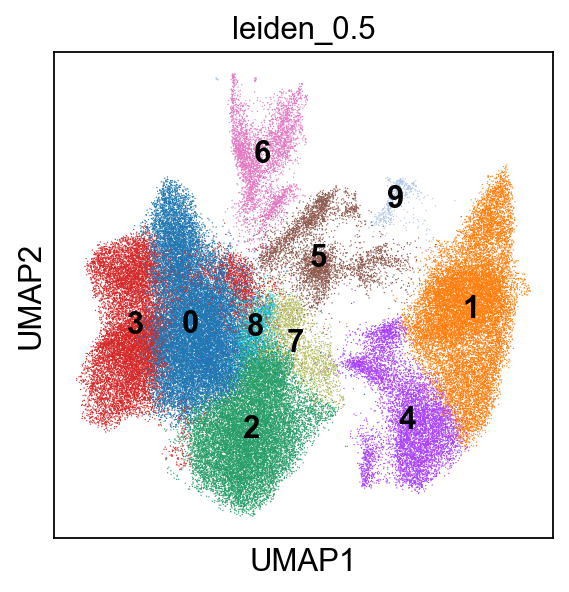

In [39]:
# leiden clustering
sc.tl.leiden(fibroblast, resolution=0.5, key_added='leiden_0.5')
sc.pl.umap(fibroblast, color='leiden_0.5', legend_loc='on data')

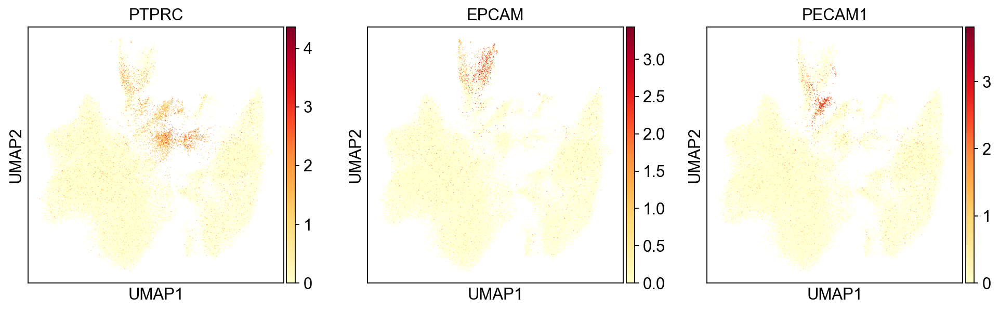

In [40]:
# find doublet
sc.pl.umap(fibroblast, color = ['PTPRC', 'EPCAM', 'PECAM1'], color_map = 'YlOrRd')

#### 1.3 Doublets filtering

In [41]:
fibroblast = fibroblast[~fibroblast.obs["leiden_0.5"].isin(["5", "6"])]
fibroblast

View of AnnData object with n_obs × n_vars = 80203 × 1000
    obs: 'sampleID', 'cellID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'total_counts_rb', 'pct_counts_rb', 'leiden_0.6', 'major_cell_type', 'Gender', 'Age', 'Histology', 'PD1', 'Chemotherapy', 'Targeted Therapy', 'Cycles', 'Pathological Response', 'Pathological Response Rate', 'Radiological Response', 'Radiological Shrinkage', 'Major Response', 'leiden_0.5'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'rb', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_0.6_colors', 'leiden_colors', 'log1p', 'major_cell_type_colors', 'neighbors', 'pca', 'umap', 'leiden_0.5_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


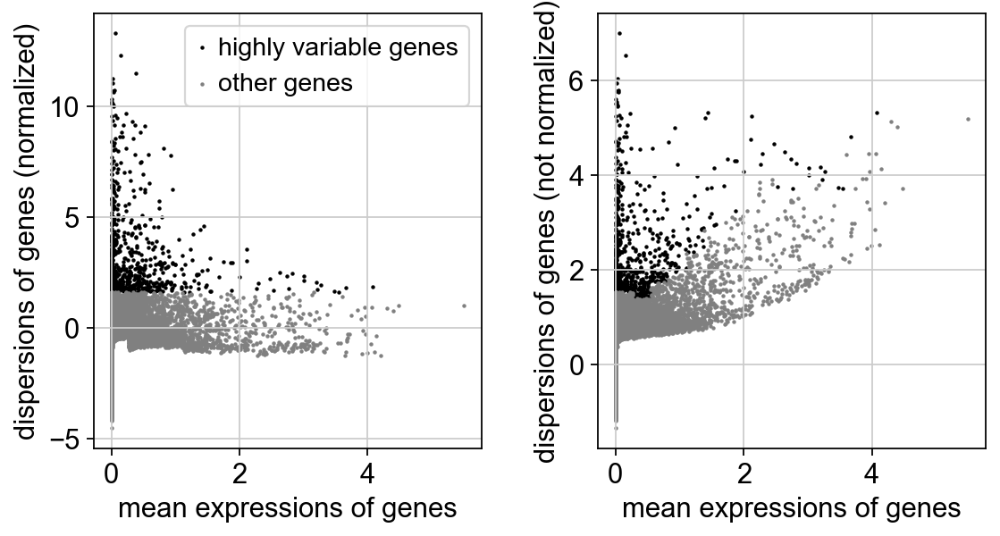

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)


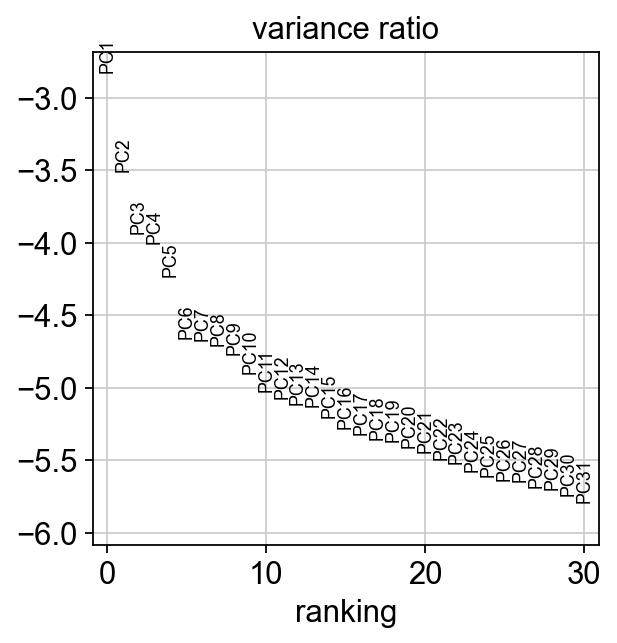

In [43]:
# HVG
fibroblast = fibroblast.raw.to_adata()
sc.pp.highly_variable_genes(fibroblast, n_top_genes = 1000)
sc.pl.highly_variable_genes(fibroblast)
fibroblast.raw = fibroblast
fibroblast = fibroblast[:, fibroblast.var.highly_variable]
fibroblast

sc.pp.scale(fibroblast, max_value=10)
sc.tl.pca(fibroblast, svd_solver='arpack')
sc.pl.pca_variance_ratio(fibroblast, log=True)

In [44]:
# harmony
sc.external.pp.harmony_integrate(fibroblast, "sampleID")
fibroblast.obsm['X_pca'] = fibroblast.obsm['X_pca_harmony']

2024-04-27 17:29:15,327 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-04-27 17:29:30,766 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-04-27 17:29:31,167 - harmonypy - INFO - Iteration 1 of 10
2024-04-27 17:30:03,976 - harmonypy - INFO - Iteration 2 of 10
2024-04-27 17:30:39,223 - harmonypy - INFO - Iteration 3 of 10
2024-04-27 17:31:12,800 - harmonypy - INFO - Converged after 3 iterations


In [45]:
# neighborhood graph
sc.pp.neighbors(fibroblast, n_neighbors=10, n_pcs = 40)
sc.tl.umap(fibroblast)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:04)


running Leiden clustering
    finished: found 11 clusters and added
    'leiden_0.6', the cluster labels (adata.obs, categorical) (0:00:43)


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


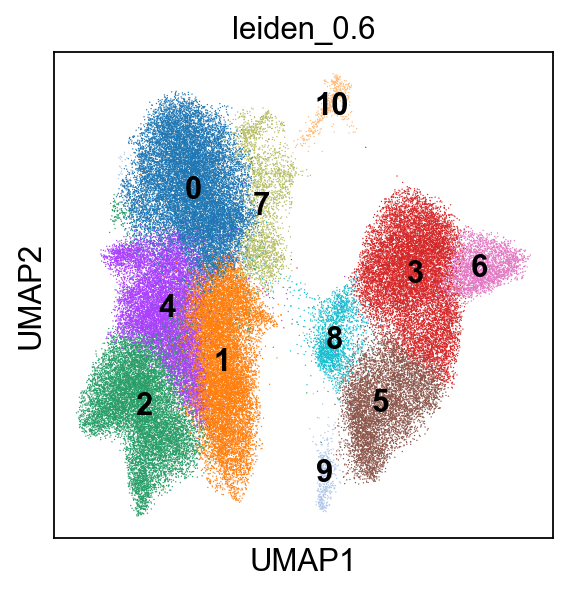

In [48]:
# leiden clustering
sc.tl.leiden(fibroblast, resolution=0.6, key_added='leiden_0.6')
sc.pl.umap(fibroblast, color='leiden_0.6', legend_loc='on data')

In [49]:
fibroblast.write_h5ad("5.LabelTransfer/post_fibroblast.h5ad")
fibroblast

AnnData object with n_obs × n_vars = 80203 × 1000
    obs: 'sampleID', 'cellID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'total_counts_rb', 'pct_counts_rb', 'leiden_0.6', 'major_cell_type', 'Gender', 'Age', 'Histology', 'PD1', 'Chemotherapy', 'Targeted Therapy', 'Cycles', 'Pathological Response', 'Pathological Response Rate', 'Radiological Response', 'Radiological Shrinkage', 'Major Response', 'leiden_0.5'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'rb', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_0.6_colors', 'leiden_colors', 'log1p', 'major_cell_type_colors', 'neighbors', 'pca', 'umap', 'leiden_0.5_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

### 2. Label Transfer - Stroma

#### 2.1 Data loading

In [3]:
from sklearn.metrics import classification_report
from scarches.models.scpoli import scPoli

 captum (see https://github.com/pytorch/captum).


In [4]:
stroma_ref = sc.read_h5ad("3.Stroma/Stroma.h5ad")
stroma_ref = stroma_ref.raw.to_adata()
stroma_ref

AnnData object with n_obs × n_vars = 97822 × 16586
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety', 'leiden_R', 'leiden_R2'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_R2_colors', 'leiden_R_colors', 'leiden_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    obsp: 'connectivities', 'distances'

In [5]:
fibroblast = sc.read_h5ad("5.LabelTransfer/post_fibroblast.h5ad")
fibroblast = fibroblast.raw.to_adata()
fibroblast

AnnData object with n_obs × n_vars = 80203 × 31901
    obs: 'sampleID', 'cellID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'total_counts_rb', 'pct_counts_rb', 'leiden_0.6', 'major_cell_type', 'Gender', 'Age', 'Histology', 'PD1', 'Chemotherapy', 'Targeted Therapy', 'Cycles', 'Pathological Response', 'Pathological Response Rate', 'Radiological Response', 'Radiological Shrinkage', 'Major Response', 'leiden_0.5'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'rb', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_0.5_colors', 'leiden_0.6_colors', 'leiden_colors', 'log1p', 'major_cell_type_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    obsp: 'connectivities', 'distances'

In [6]:
fibroblast.var_names.intersection(stroma_ref.var_names)

Index(['FAM87B', 'LINC00115', 'FAM41C', 'SAMD11', 'NOC2L', 'KLHL17', 'PLEKHN1',
       'PERM1', 'HES4', 'ISG15',
       ...
       'FTCD', 'SPATC1L', 'MCM3AP-AS1', 'MCM3AP', 'YBEY', 'C21orf58', 'PCNT',
       'DIP2A', 'S100B', 'PRMT2'],
      dtype='object', length=16586)

In [7]:
fibroblast = fibroblast[:, stroma_ref.var_names]
fibroblast

View of AnnData object with n_obs × n_vars = 80203 × 16586
    obs: 'sampleID', 'cellID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'total_counts_rb', 'pct_counts_rb', 'leiden_0.6', 'major_cell_type', 'Gender', 'Age', 'Histology', 'PD1', 'Chemotherapy', 'Targeted Therapy', 'Cycles', 'Pathological Response', 'Pathological Response Rate', 'Radiological Response', 'Radiological Shrinkage', 'Major Response', 'leiden_0.5'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'rb', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_0.5_colors', 'leiden_0.6_colors', 'leiden_colors', 'log1p', 'major_cell_type_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    obsp: 'connectivities', 'distances'

#### 2.2 Model training

In [8]:
scpoli_model = scPoli(
    adata = stroma_ref,
    condition_keys = "dataset",
    cell_type_keys = "minor_cell_type",
    embedding_dims = 10,
    recon_loss = 'nb',
)

Embedding dictionary:
 	Num conditions: [31]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 16586 129 10
	Mean/Var Layer in/out: 129 10
Decoder Architecture:
	First Layer in, out and cond:  10 129 10
	Output Layer in/out:  129 16586 



In [9]:
early_stopping_kwargs = {
    "early_stopping_metric": "val_prototype_loss",
    "mode": "min",
    "threshold": 0,
    "patience": 20,
    "reduce_lr": True,
    "lr_patience": 13,
    "lr_factor": 0.1,
}

scpoli_model.train(
    n_epochs = 50,
    pretraining_epochs = 40,
    early_stopping_kwargs = early_stopping_kwargs,
    eta = 5,
)

/home/cqy/anaconda3/envs/scarches/lib/python3.12/site-packages/torch/cuda/__init__.py:619: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
INFO:scarches.trainers.scpoli.trainer:GPU available: False


Initializing dataloaders
Starting training
 |████████████████████| 100.0%  - val_loss: 4523.77 - val_cvae_loss: 4512.27 - val_prototype_loss:   11.50 - val_labeled_loss:    2.30


In [12]:
fibroblast.obs["dataset"] = "post_treatment"
fibroblast.obs["minor_cell_type"] = "unknown"
scpoli_query = scPoli.load_query_data(
    adata = fibroblast,
    reference_model = scpoli_model,
    labeled_indices = [],
)

Embedding dictionary:
 	Num conditions: [32]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 16586 129 10
	Mean/Var Layer in/out: 129 10
Decoder Architecture:
	First Layer in, out and cond:  10 129 10
	Output Layer in/out:  129 16586 



In [13]:
scpoli_query.train(
    n_epochs = 50,
    pretraining_epochs = 40,
    eta = 10
)

INFO:scarches.trainers.scpoli.trainer:GPU available: False


The missing labels are: {'unknown'}
Therefore integer value of those labels is set to -1
The missing labels are: {'unknown'}
Therefore integer value of those labels is set to -1
The missing labels are: {'unknown'}
Therefore integer value of those labels is set to -1
The missing labels are: {'unknown'}
Therefore integer value of those labels is set to -1
Initializing dataloaders
Starting training
 |████████████████----| 80.0%  - val_loss: 5340.20 - val_cvae_loss: 5340.20
Initializing unlabeled prototypes with Leiden with an unknown number of  clusters.
computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:29)
running Leiden clustering


/home/cqy/anaconda3/envs/scarches/lib/python3.12/site-packages/scarches/trainers/scpoli/trainer.py:488: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(lat_adata, resolution=self.clustering_res)


    finished: found 31 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:01:29)
Clustering succesful. Found 31 clusters.
 |████████████████████| 100.0%  - val_loss: 5343.53 - val_cvae_loss: 5343.53 - val_prototype_loss:    0.00 - val_unlabeled_loss:    0.12


In [15]:
results_dict = scpoli_query.classify(fibroblast, scale_uncertainties=True)

/home/cqy/anaconda3/envs/scarches/lib/python3.12/site-packages/scarches/models/scpoli/scpoli_model.py:454: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:274.)
  c = torch.tensor(label_tensor, device=device).T


In [17]:
fibroblast.obs["minor_cell_type"] = results_dict["minor_cell_type"]["preds"].tolist()
fibroblast.obs["uncertainty"] = results_dict["minor_cell_type"]["uncert"].tolist()

running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:53)


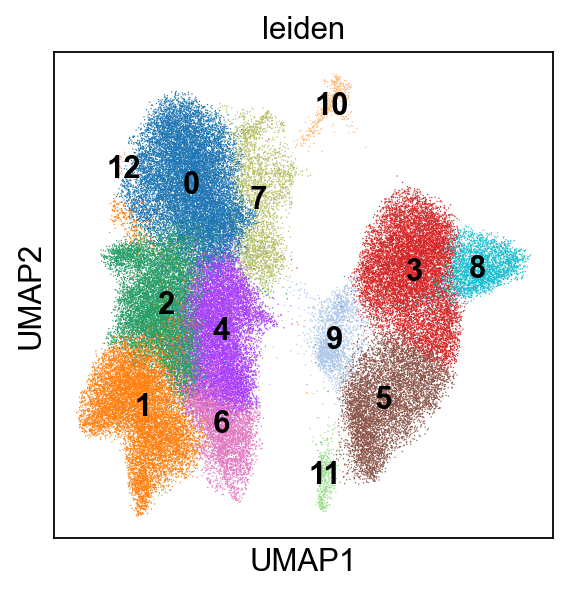

In [32]:
sc.tl.leiden(fibroblast, resolution = 0.8)
sc.pl.umap(fibroblast, color='leiden', legend_loc='on data')

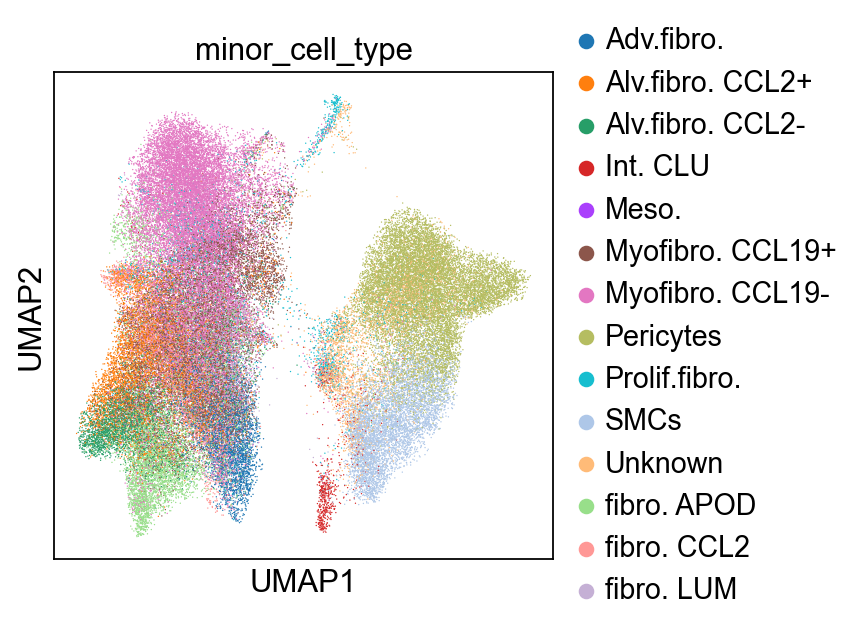

In [17]:
sc.pl.umap(fibroblast, color = ["minor_cell_type"])

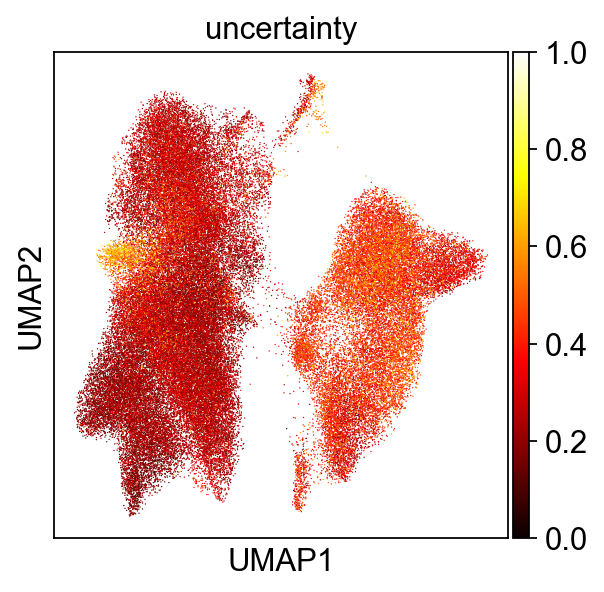

In [23]:
sc.pl.umap(fibroblast, color = ["uncertainty"], cmap = "hot")

In [33]:
fibroblast.write_h5ad("5.LabelTransfer/post_fibroblast_tran.h5ad")
fibroblast

AnnData object with n_obs × n_vars = 80203 × 16586
    obs: 'sampleID', 'cellID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'total_counts_rb', 'pct_counts_rb', 'leiden_0.6', 'major_cell_type', 'Gender', 'Age', 'Histology', 'PD1', 'Chemotherapy', 'Targeted Therapy', 'Cycles', 'Pathological Response', 'Pathological Response Rate', 'Radiological Response', 'Radiological Shrinkage', 'Major Response', 'leiden_0.5', 'dataset', 'conditions_combined', 'minor_cell_type', 'uncertainty'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'rb', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_0.5_colors', 'leiden_0.6_colors', 'log1p', 'major_cell_type_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'umap', 'leiden_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    obsp: 'connectivities', 'distances'

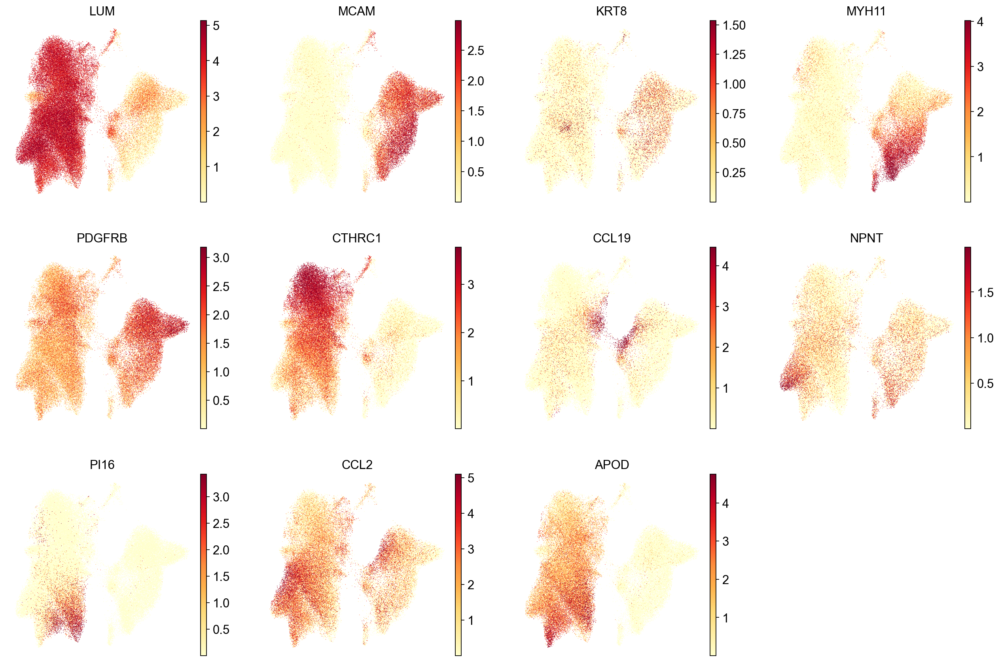

In [19]:
sc.pl.umap(fibroblast,
           color = ["LUM", "MCAM", "KRT8",
                    "MYH11", "PDGFRB",
                    "CTHRC1", "CCL19", "NPNT", "PI16",
                    "CCL2", "APOD"],
           vmin = 0.0001,
           vmax = 'p99',
           color_map = "YlOrRd",
           frameon = False)

In [24]:
fibroblast.obs[["sampleID", "leiden", "minor_cell_type", "Major Response"]].to_csv("5.LabelTransfer/stroma_celltype.csv")
fibroblast.obs[["minor_cell_type", "uncertainty"]].to_csv("5.LabelTransfer/stroma_uncertainty.csv")

### 3. Post-treatment endo datasets

#### 3.1 Patient filtering

In [46]:
endo = sc.read_h5ad("../data/endothelial.h5ad")
endo = endo.raw.to_adata()
endo.uns['log1p']["base"] = None
endo

AnnData object with n_obs × n_vars = 45168 × 31831
    obs: 'sampleID', 'cellID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'major_cell_type', 'total_counts_rb', 'pct_counts_rb', 'leiden_0.6', 'leiden', 'gender', 'age', 'smoking_history', 'cancer_type', 'pre_treatment_staging', 'anti-PD1_therapy', 'chemotherapy', 'targeted_therapy', 'cycles', 'pathological_response', 'pathological_response_rate', 'radiological_response', 'major_response', 'leiden_0.5'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'rb', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'leiden_0.5_colors', 'leiden_0.6_colors', 'leiden_colors', 'log1p', 'major_cell_type_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    obsp: 'connectivities', 'distances'

In [47]:
metadata = pd.read_csv("5.LabelTransfer/metadata.csv")
metadata.head(5)

,sampleID,Gender,Age,Histology,PD1,Chemotherapy,Targeted Therapy,Cycles,Pathological Response,Radiological Response,Major Response,Major Radio Response
0,P18,F,52,LUAD,Pembrolizumab,Carboplatin + Pemetrexed,No,2,pCR,PR,MPR,PR
1,P22,M,68,LUSC,Sintilimab,Carboplatin + Abraxane,No,2,non-MPR,PR,non-MPR,PR
2,P43,M,46,LUAD,Camrelizumab,Cisplatin(C1) + Carboplatin(C2) + Pemetrexed(C...,Bevacizumab,2,non-MPR,PR,non-MPR,PR
3,P52,F,34,LUAD,Sintilimab(C1),Carboplatin + Pemetrexed,No,3,non-MPR,PR,non-MPR,PR
4,P64,M,64,LUAD,Pembrolizumab,Carboplatin + Pemetrexed,No,3,non-MPR,PR,non-MPR,PR


In [48]:
endo = endo[endo.obs["sampleID"].isin(metadata["sampleID"])]
endo

View of AnnData object with n_obs × n_vars = 23752 × 31831
    obs: 'sampleID', 'cellID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'major_cell_type', 'total_counts_rb', 'pct_counts_rb', 'leiden_0.6', 'leiden', 'gender', 'age', 'smoking_history', 'cancer_type', 'pre_treatment_staging', 'anti-PD1_therapy', 'chemotherapy', 'targeted_therapy', 'cycles', 'pathological_response', 'pathological_response_rate', 'radiological_response', 'major_response', 'leiden_0.5'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'rb', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'leiden_0.5_colors', 'leiden_0.6_colors', 'leiden_colors', 'log1p', 'major_cell_type_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    obsp: 'connectivities', 'distances'

In [49]:
len(pd.unique(endo.obs["sampleID"]))

55

In [50]:
counts = pd.DataFrame(endo.obs["sampleID"].value_counts())
patients = counts.iloc[0:45, ].index

In [51]:
endo = endo[endo.obs["sampleID"].isin(patients)]
endo

View of AnnData object with n_obs × n_vars = 23347 × 31831
    obs: 'sampleID', 'cellID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'major_cell_type', 'total_counts_rb', 'pct_counts_rb', 'leiden_0.6', 'leiden', 'gender', 'age', 'smoking_history', 'cancer_type', 'pre_treatment_staging', 'anti-PD1_therapy', 'chemotherapy', 'targeted_therapy', 'cycles', 'pathological_response', 'pathological_response_rate', 'radiological_response', 'major_response', 'leiden_0.5'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'rb', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'leiden_0.5_colors', 'leiden_0.6_colors', 'leiden_colors', 'log1p', 'major_cell_type_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    obsp: 'connectivities', 'distances'

#### 1.2 Clustering

extracting highly variable genes
    finished (0:00:01)


/home/cqy/anaconda3/envs/scarches/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:664: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}


--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


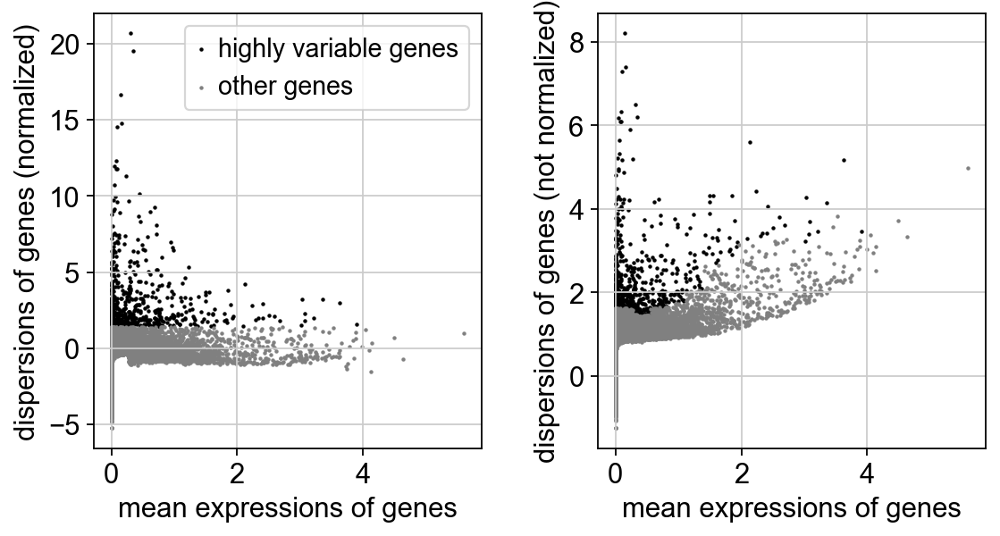

/home/cqy/anaconda3/envs/scarches/lib/python3.12/site-packages/scanpy/preprocessing/_scale.py:299: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=50
    finished (0:00:01)


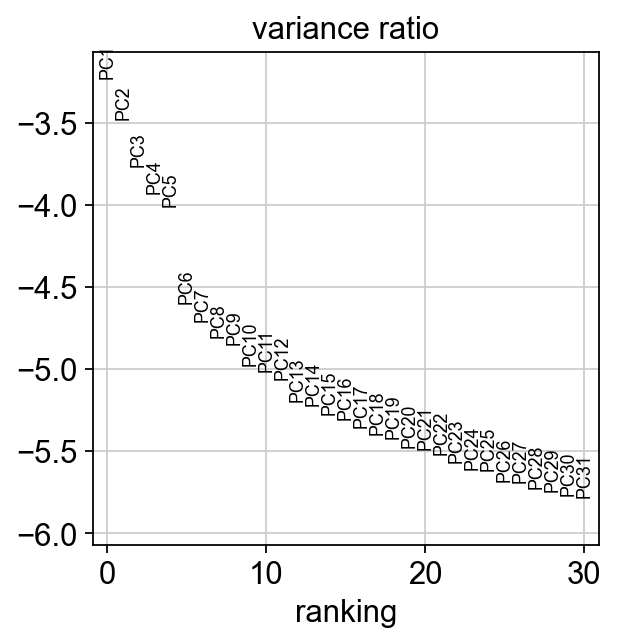

In [52]:
# HVG
sc.pp.highly_variable_genes(endo, n_top_genes = 1000)
sc.pl.highly_variable_genes(endo)
endo.raw = endo
endo = endo[:, endo.var.highly_variable]
endo

sc.pp.scale(endo, max_value=10)
sc.tl.pca(endo, svd_solver='arpack')
sc.pl.pca_variance_ratio(endo, log=True)

In [53]:
# harmony
sc.external.pp.harmony_integrate(endo, "sampleID", max_iter_harmony = 30)
endo.obsm['X_pca'] = endo.obsm['X_pca_harmony']

2024-05-01 14:48:59,123 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-05-01 14:49:01,643 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-05-01 14:49:01,791 - harmonypy - INFO - Iteration 1 of 30
2024-05-01 14:49:10,050 - harmonypy - INFO - Iteration 2 of 30
2024-05-01 14:49:18,779 - harmonypy - INFO - Iteration 3 of 30
2024-05-01 14:49:27,921 - harmonypy - INFO - Iteration 4 of 30
2024-05-01 14:49:34,029 - harmonypy - INFO - Iteration 5 of 30
2024-05-01 14:49:39,832 - harmonypy - INFO - Iteration 6 of 30
2024-05-01 14:49:44,366 - harmonypy - INFO - Iteration 7 of 30
2024-05-01 14:49:48,408 - harmonypy - INFO - Iteration 8 of 30
2024-05-01 14:49:53,172 - harmonypy - INFO - Iteration 9 of 30
2024-05-01 14:49:57,642 - harmonypy - INFO - Iteration 10 of 30
2024-05-01 14:50:02,238 - harmonypy - INFO - Iteration 11 of 30
2024-05-01 14:50:05,648 - harmonypy - INFO - Iteration 12 of 30
2024-05-01 14:50:09,378 - harmonypy - INFO - Iteration 13 of

In [54]:
# neighborhood graph
sc.pp.neighbors(endo, n_neighbors=10, n_pcs = 40)
sc.tl.umap(endo)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:16)


running Leiden clustering
    finished: found 10 clusters and added
    'leiden_0.5', the cluster labels (adata.obs, categorical) (0:00:09)


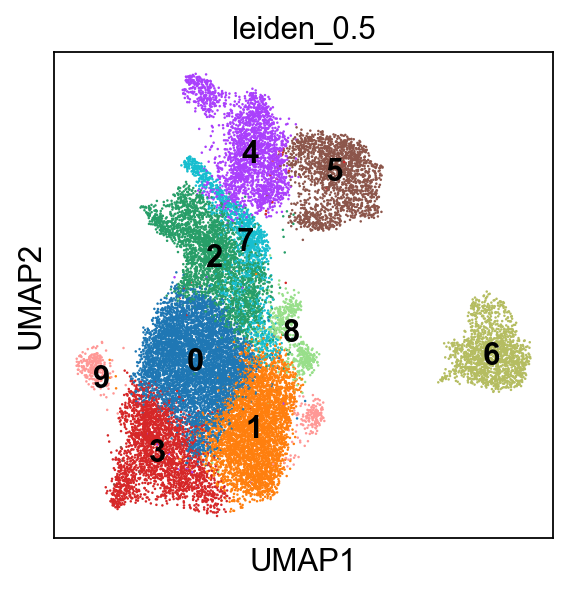

In [57]:
# leiden clustering
sc.tl.leiden(endo, resolution=0.5, key_added='leiden_0.5')
sc.pl.umap(endo, color='leiden_0.5', legend_loc='on data')

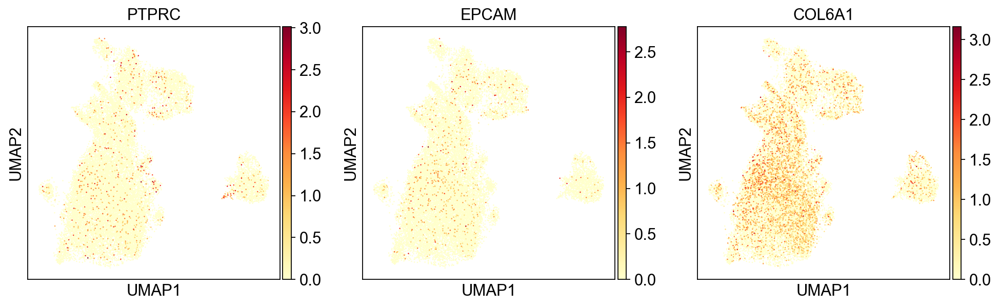

In [56]:
# find doublet
sc.pl.umap(endo, color = ['PTPRC', 'EPCAM', 'COL6A1'], color_map = 'YlOrRd')

In [59]:
endo.write_h5ad("5.LabelTransfer/post_endo.h5ad")
endo

AnnData object with n_obs × n_vars = 23347 × 1000
    obs: 'sampleID', 'cellID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'major_cell_type', 'total_counts_rb', 'pct_counts_rb', 'leiden_0.6', 'leiden', 'gender', 'age', 'smoking_history', 'cancer_type', 'pre_treatment_staging', 'anti-PD1_therapy', 'chemotherapy', 'targeted_therapy', 'cycles', 'pathological_response', 'pathological_response_rate', 'radiological_response', 'major_response', 'leiden_0.5', 'leiden_0.3'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'rb', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_0.5_colors', 'leiden_0.6_colors', 'leiden_colors', 'log1p', 'major_cell_type_colors', 'neighbors', 'pca', 'umap', 'leiden_0.3', 'leiden_0.3_colors', 'leiden_0.5'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

### 4. Label Transfer - Endo

#### 4.1 Data loading

In [60]:
from sklearn.metrics import classification_report
from scarches.models.scpoli import scPoli

 captum (see https://github.com/pytorch/captum).


In [62]:
endo_ref = sc.read_h5ad("4.Endo/Endo.h5ad")
endo_ref = endo_ref.raw.to_adata()
endo_ref

AnnData object with n_obs × n_vars = 80050 × 16586
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety', 'leiden_R'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_R_colors', 'leiden_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    obsp: 'connectivities', 'distances'

In [63]:
endo = sc.read_h5ad("5.LabelTransfer/post_endo.h5ad")
endo = endo.raw.to_adata()
endo

AnnData object with n_obs × n_vars = 23347 × 31831
    obs: 'sampleID', 'cellID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'major_cell_type', 'total_counts_rb', 'pct_counts_rb', 'leiden_0.6', 'leiden', 'gender', 'age', 'smoking_history', 'cancer_type', 'pre_treatment_staging', 'anti-PD1_therapy', 'chemotherapy', 'targeted_therapy', 'cycles', 'pathological_response', 'pathological_response_rate', 'radiological_response', 'major_response', 'leiden_0.5', 'leiden_0.3'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'rb', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'leiden_0.3', 'leiden_0.3_colors', 'leiden_0.5', 'leiden_0.5_colors', 'leiden_0.6_colors', 'leiden_colors', 'log1p', 'major_cell_type_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    obsp: 'connectivities', 'distances'

In [64]:
endo.var_names.intersection(endo_ref.var_names)

Index(['FAM87B', 'LINC00115', 'FAM41C', 'SAMD11', 'NOC2L', 'KLHL17', 'PLEKHN1',
       'PERM1', 'HES4', 'ISG15',
       ...
       'FTCD', 'SPATC1L', 'MCM3AP-AS1', 'MCM3AP', 'YBEY', 'C21orf58', 'PCNT',
       'DIP2A', 'S100B', 'PRMT2'],
      dtype='object', length=16586)

In [67]:
endo = endo[:, endo_ref.var_names]
endo

View of AnnData object with n_obs × n_vars = 23347 × 16586
    obs: 'sampleID', 'cellID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'major_cell_type', 'total_counts_rb', 'pct_counts_rb', 'leiden_0.6', 'leiden', 'gender', 'age', 'smoking_history', 'cancer_type', 'pre_treatment_staging', 'anti-PD1_therapy', 'chemotherapy', 'targeted_therapy', 'cycles', 'pathological_response', 'pathological_response_rate', 'radiological_response', 'major_response', 'leiden_0.5', 'leiden_0.3'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'rb', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'leiden_0.3', 'leiden_0.3_colors', 'leiden_0.5', 'leiden_0.6_colors', 'leiden_colors', 'log1p', 'major_cell_type_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    obsp: 'connectivities', 'distances'

#### 2.2 Model training

In [68]:
scpoli_model = scPoli(
    adata = endo_ref,
    condition_keys = "dataset",
    cell_type_keys = "minor_cell_type",
    embedding_dims = 10,
    recon_loss = 'nb',
)

Embedding dictionary:
 	Num conditions: [27]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 16586 129 10
	Mean/Var Layer in/out: 129 10
Decoder Architecture:
	First Layer in, out and cond:  10 129 10
	Output Layer in/out:  129 16586 



In [69]:
early_stopping_kwargs = {
    "early_stopping_metric": "val_prototype_loss",
    "mode": "min",
    "threshold": 0,
    "patience": 20,
    "reduce_lr": True,
    "lr_patience": 13,
    "lr_factor": 0.1,
}

scpoli_model.train(
    n_epochs = 50,
    pretraining_epochs = 40,
    early_stopping_kwargs = early_stopping_kwargs,
    eta = 5,
)

/home/cqy/anaconda3/envs/scarches/lib/python3.12/site-packages/torch/cuda/__init__.py:619: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
INFO:scarches.trainers.scpoli.trainer:GPU available: False


Initializing dataloaders
Starting training
 |████████████████████| 100.0%  - val_loss: 4440.96 - val_cvae_loss: 4431.83 - val_prototype_loss:    9.13 - val_labeled_loss:    1.83


In [70]:
endo.obs["dataset"] = "post_treatment"
endo.obs["minor_cell_type"] = "unknown"
scpoli_query = scPoli.load_query_data(
    adata = endo,
    reference_model = scpoli_model,
    labeled_indices = [],
)

/tmp/ipykernel_40540/1901196446.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  endo.obs["dataset"] = "post_treatment"


Embedding dictionary:
 	Num conditions: [28]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 16586 129 10
	Mean/Var Layer in/out: 129 10
Decoder Architecture:
	First Layer in, out and cond:  10 129 10
	Output Layer in/out:  129 16586 



In [71]:
scpoli_query.train(
    n_epochs = 50,
    pretraining_epochs = 40,
    eta = 10
)

INFO:scarches.trainers.scpoli.trainer:GPU available: False


The missing labels are: {'unknown'}
Therefore integer value of those labels is set to -1
The missing labels are: {'unknown'}
Therefore integer value of those labels is set to -1
The missing labels are: {'unknown'}
Therefore integer value of those labels is set to -1
The missing labels are: {'unknown'}
Therefore integer value of those labels is set to -1
Initializing dataloaders
Starting training
 |████████████████----| 80.0%  - val_loss: 5353.94 - val_cvae_loss: 5353.94
Initializing unlabeled prototypes with Leiden with an unknown number of  clusters.
computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
running Leiden clustering
    finished: found 29 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:14)
Clustering succesful. Found 29 clusters.
 |████████████████████| 100.0%  - val_l

In [72]:
results_dict = scpoli_query.classify(endo, scale_uncertainties=True)

/home/cqy/anaconda3/envs/scarches/lib/python3.12/site-packages/scarches/models/scpoli/scpoli_model.py:454: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:274.)
  c = torch.tensor(label_tensor, device=device).T


In [73]:
endo.obs["minor_cell_type"] = results_dict["minor_cell_type"]["preds"].tolist()
endo.obs["uncertainty"] = results_dict["minor_cell_type"]["uncert"].tolist()

running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:10)


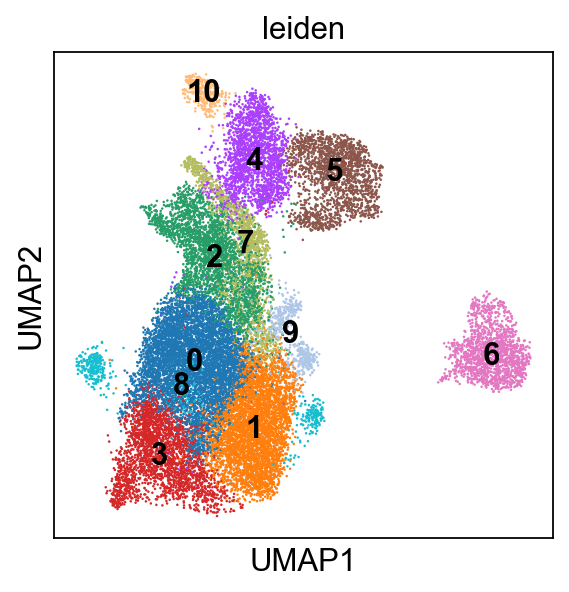

In [20]:
sc.tl.leiden(endo, resolution = 0.6)
sc.pl.umap(endo, color='leiden', legend_loc='on data')

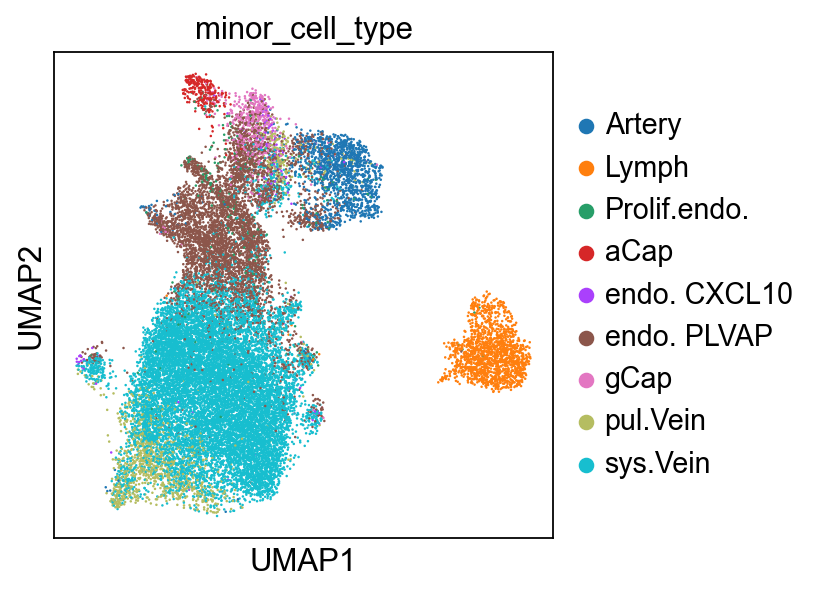

In [21]:
sc.pl.umap(endo, color = ["minor_cell_type"])

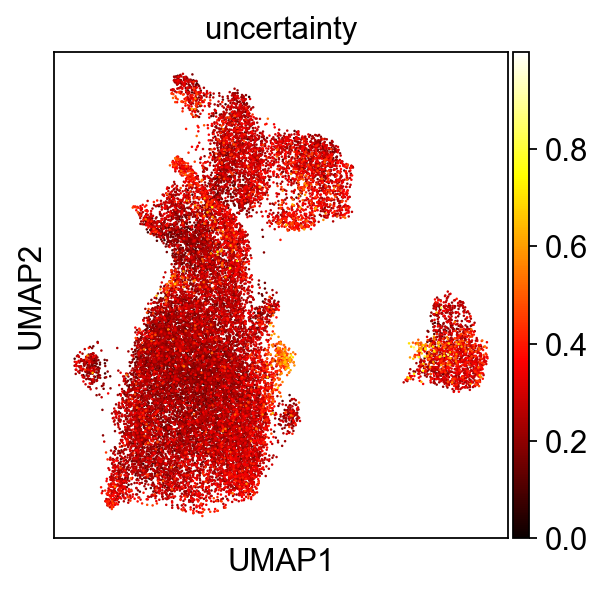

In [23]:
sc.pl.umap(endo, color = ["uncertainty"], cmap = "hot")

In [24]:
endo.write_h5ad("5.LabelTransfer/post_endo_tran.h5ad")
endo

AnnData object with n_obs × n_vars = 23347 × 16586
    obs: 'sampleID', 'cellID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'major_cell_type', 'total_counts_rb', 'pct_counts_rb', 'leiden_0.6', 'leiden', 'gender', 'age', 'smoking_history', 'cancer_type', 'pre_treatment_staging', 'anti-PD1_therapy', 'chemotherapy', 'targeted_therapy', 'cycles', 'pathological_response', 'pathological_response_rate', 'radiological_response', 'major_response', 'leiden_0.5', 'leiden_0.3', 'dataset', 'minor_cell_type', 'conditions_combined', 'uncertainty'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'rb', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'leiden_0.3', 'leiden_0.3_colors', 'leiden_0.5', 'leiden_0.6_colors', 'leiden_colors', 'log1p', 'major_cell_type_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
   

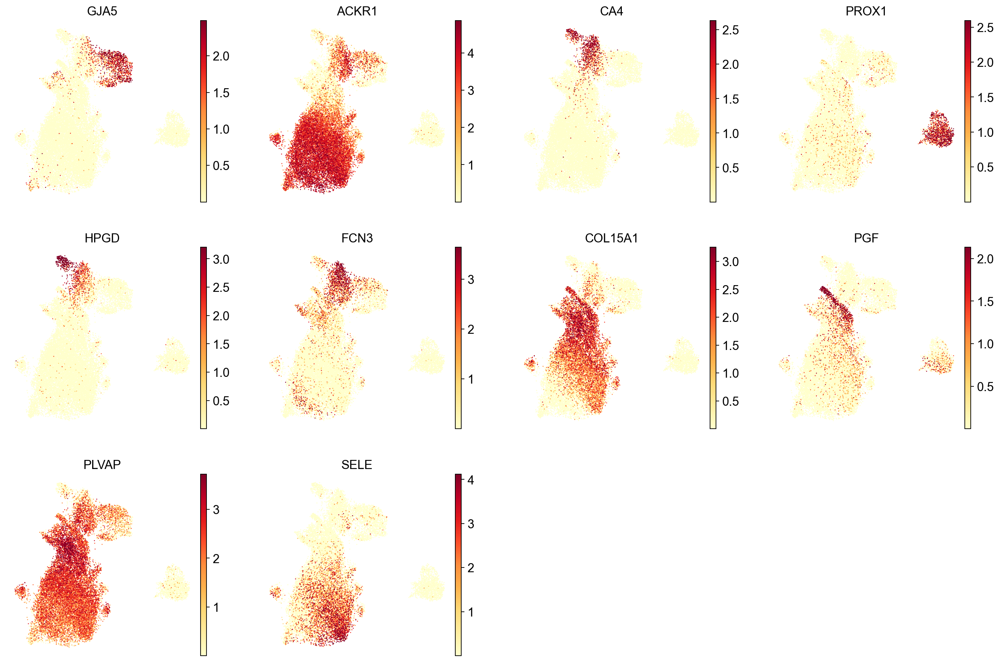

In [17]:
sc.pl.umap(endo, 
           color = ["GJA5", "ACKR1", "CA4", "PROX1", 
                    "HPGD", "FCN3", "COL15A1", "PGF",
                    "PLVAP", "SELE"],
           frameon = False,
           vmin = 0.0001,
           vmax = 'p99',
           color_map = 'YlOrRd')

In [25]:
endo.obs[["sampleID", "leiden", "minor_cell_type", "major_response"]].to_csv("5.LabelTransfer/endo_celltype.csv")
endo.obs[["minor_cell_type", "uncertainty"]].to_csv("5.LabelTransfer/endo_uncertainty.csv")